### Setup

In [1]:
import pandas as pd
import numpy as np
import os

from src.radiomics import extract_features_from_images
from src.embeddings import train_and_evaluate_model

from sklearn.model_selection import train_test_split

# To balance the dataset during training
from sklearn.utils.class_weight import compute_class_weight

# Models:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# Standar Scaler:
from sklearn.preprocessing import StandardScaler

# Visualize tree:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Metrics:
from sklearn.metrics import accuracy_score, classification_report

import warnings
warnings.filterwarnings("ignore")


#### Constants

In [2]:
label_file = '/home/opc/Retina/BRSET/labels.csv'
image_folder = '/home/opc/Retina/BRSET/images/'

LABEL = 'quality'

VERBOSE = False
SAMPLE = None # Set None to use all images
N_JOBS = -1

CLASS_WEIGTHS = True

### Feature Engineering

We'll extract the features from pyradiomics. Pyradiomics is a Python package used in radiomic analysis to extract quantitative features from medical images. The features can be categorized into several groups, each representing different aspects of the image's texture, shape, and intensity.

##### 1. First Order Statistics (Used)
- **Description**: Describe the distribution of voxel intensities within the image region defined by the mask.
- **Examples**: Energy, Entropy, Kurtosis, Maximum, Mean, Median, Minimum, Range, Skewness, Variance.

##### 2. Shape-Based Features (Not used)
- **Description**: 3D shape-based features describing the shape and size of the Region of Interest (ROI).
- **Examples**: Surface Area, Volume, Maximum 3D Diameter, Sphericity, Spherical Disproportion, Compactness.

##### 3. Texture Features
Texture features describe the texture of the image by analyzing the distribution and relationship of intensities.

* Gray Level Co-occurrence Matrix (GLCM) (Used)
    - **Description**: Analyze the co-occurrence of pairs of voxels.
    - **Examples**: Autocorrelation, Contrast, Correlation, Cluster Prominence, Cluster Shade, Dissimilarity, Energy, Entropy, Homogeneity.

* Gray Level Run Length Matrix (GLRLM) (Used)
    - **Description**: Quantify gray level runs (length in pixels of consecutive pixels with the same gray level value).
    - **Examples**: Short Run Emphasis, Long Run Emphasis, Gray Level Non-Uniformity, Run Length Non-Uniformity.

* Gray Level Size Zone Matrix (GLSZM) (Used)
    - **Description**: Focus on zones of similar gray-level values, quantifying the size of each zone.
    - **Examples**: Small Area Emphasis, Large Area Emphasis, Zone Size Non-Uniformity, Zone Size Non-Uniformity Normalized.

* Gray Level Distance Zone Matrix (GLDZM) (Not used)
    - **Description**: Quantify the distribution of size zones at different distances.
    - **Examples**: Small Distance Emphasis, Large Distance Emphasis.

##### 4. Higher Order Statistics (Not used)
- **Description**: Complex features derived from applying filters or mathematical transformations to the ROI.
- **Examples**: Features from wavelet-transformed images, Laplacian of Gaussian (LoG) filtered images.


In [3]:
# Extract features
features_df = extract_features_from_images(image_folder, sample_size=SAMPLE, n_jobs=N_JOBS, verbose=VERBOSE)

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

### Get labels

In [4]:
# Load labels
labels_df = pd.read_csv(label_file)
labels = labels_df.set_index('image_id')[LABEL].apply(lambda x: 1 if x == 'Adequate' else 0)

# Merge features with labels
data = features_df.merge(labels, left_index=True, right_index=True)

In [5]:
# Save radiomics dataframe
# Create Radiomics directory if it does not exist
os.makedirs('Radiomics', exist_ok=True)
data.to_csv('Radiomics/radiomics.csv')

data

,10Percentile,90Percentile,Energy,Entropy,InterquartileRange,Kurtosis,Maximum,MeanAbsoluteDeviation,Mean,Median,...,LowGrayLevelZoneEmphasis,SizeZoneNonUniformity,SizeZoneNonUniformityNormalized,SmallAreaEmphasis,SmallAreaHighGrayLevelEmphasis,SmallAreaLowGrayLevelEmphasis,ZoneEntropy,ZonePercentage,ZoneVariance,quality
img00001,0.0,138.0,13500227667.0,2.4487467726855,63.0,3.473056428937512,244.0,41.87654835972663,49.790820100316665,31.0,...,0.2898625374856455,1246.2717043856285,0.15934940600762415,0.38194643965917835,7.19575254760628,0.10663135276413725,6.487907921113563,0.0030129672006102212,199785150.88937446,1
img00002,0.0,135.0,12831142875.0,2.472195611951996,63.0,3.241146108183609,244.0,41.03228652097043,51.14764377454861,33.0,...,0.32451312135613875,1302.4903914590748,0.15450657075433863,0.37399343580536465,6.925533591164235,0.11356194664184692,6.459314498901484,0.003380760225897345,161920578.22578707,1
img00003,0.0,121.0,12487338903.0,2.551255393517221,61.0,3.6623801940024587,255.0,37.02274858752917,53.604736192421804,44.0,...,0.2584633518604689,1403.4548238897396,0.1535172636064034,0.3782530303464115,6.984558607462542,0.09396687680720602,6.569696885451042,0.003666300116862815,91316636.48908189,1
img00004,0.0,113.0,11064342703.0,2.452304299389999,56.0,3.7659316570521586,254.0,34.61531727339317,50.859467452061786,41.0,...,0.3020125316451315,1304.3656152820968,0.1448651283076518,0.36300743276418707,5.549422403814976,0.10709646494882115,6.422968900973226,0.00361095671102962,130467232.36404507,1
img00005,0.0,143.0,13246468490.0,2.308527238409373,69.0,3.4665974978376646,254.0,44.76935034718188,46.42086735148116,26.0,...,0.25630569391654284,1096.4761780104711,0.14351782434692031,0.3585682054851353,8.828063614834143,0.08844963983100014,6.800658156389784,0.003063939279460939,229718903.98152325,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
img16262,0.0,108.0,10494784375.0,2.423578906410078,54.0,4.269068269882387,255.0,33.579410232110185,49.62665538944513,42.0,...,0.43003735697102785,1585.8600522663783,0.1429088990057113,0.36022603903782713,4.736919077839391,0.14409155604505663,6.169296754989357,0.004450331699499744,108911522.0688356,1
img16263,0.0,117.0,11205340800.0,2.4541599285630045,60.0,2.7915064806639522,203.0,35.65425240870868,50.95159537393293,41.0,...,0.3521803738890085,1116.1979358643569,0.13714190144543026,0.34927138888099774,4.926410428790921,0.1183287568227435,6.387799417927889,0.0032640578266403906,141454269.70107406,1
img16264,0.0,115.0,10611206517.0,2.4051559708046897,58.0,2.7004881367310114,183.0,34.97921759158119,49.51480155378617,39.0,...,0.3340313450573222,955.0243467933492,0.1417791488707466,0.3596228223336437,5.164655922196338,0.11400665021444975,6.350630153834056,0.0027013998673362416,185680657.1489772,1
img16265,0.0,142.0,16050550737.0,2.6949919789968035,68.0,3.1594907005334627,255.0,43.25280544906413,59.91104429798494,45.0,...,0.34180727741912476,1610.951923076923,0.15489922337278106,0.38168799420638416,6.8206635110205385,0.12803644729005023,6.6345143484269515,0.004170807396124839,81048900.80707392,1


### Run Models

In [6]:
# Split data into features and labels
X = data.drop(LABEL, axis=1)
y = data[LABEL]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [7]:
if CLASS_WEIGTHS:
    class_weights = compute_class_weight("balanced", classes=np.unique(y_train), y=y_train)
    # Create a dictionary from class labels and weights
    class_weights = {class_label: weight for class_label, weight in zip(np.unique(y_train), class_weights)}
    print(f'Setting class weigths to: {class_weights}')

    models = [
        #("SVM", SVC(class_weight=class_weights, probability=True)),
        ("Logistic Regression", LogisticRegression(class_weight=class_weights)),
        ('Decision Tree', DecisionTreeClassifier(class_weight=class_weights)),
    ]
else:
    models = [
        #("SVM", SVC(probability=True)),
        ("Logistic Regression", LogisticRegression())
        ('Decision Tree', DecisionTreeClassifier()),
    ]

Setting class weigths to: {0: 4.119392185238785, 1: 0.5690723710515794}


####################  Logistic Regression  ####################


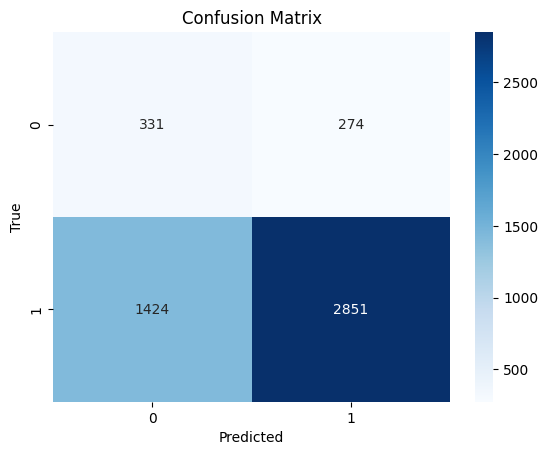

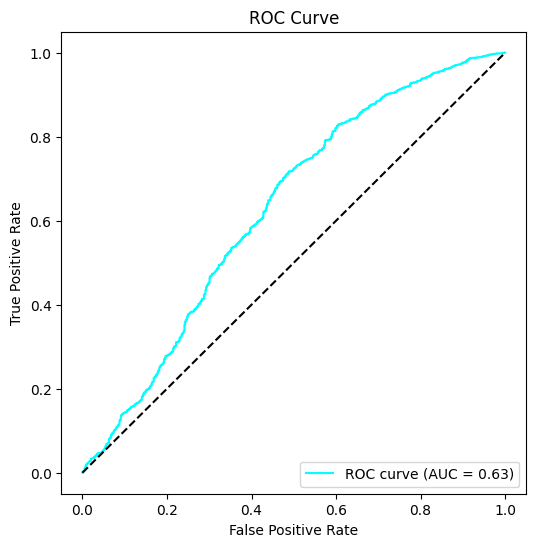

              precision    recall  f1-score   support

           0       0.19      0.55      0.28       605
           1       0.91      0.67      0.77      4275

    accuracy                           0.65      4880
   macro avg       0.55      0.61      0.53      4880
weighted avg       0.82      0.65      0.71      4880

####################  Decision Tree  ####################


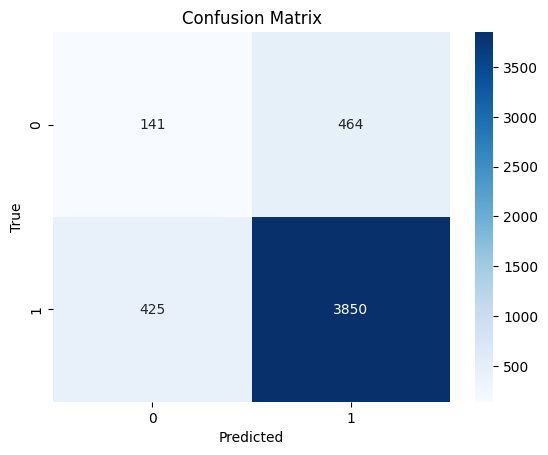

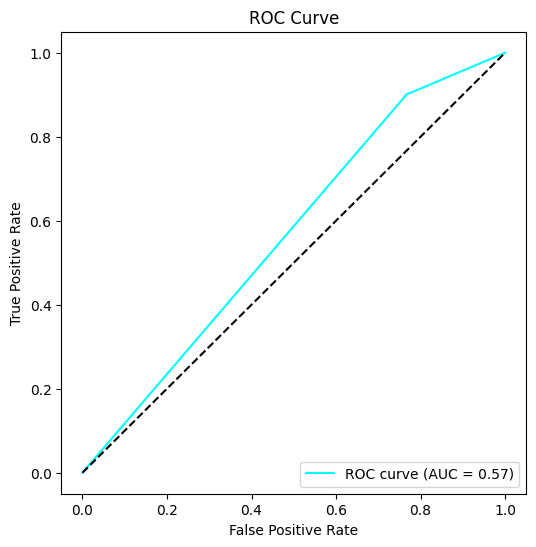

              precision    recall  f1-score   support

           0       0.25      0.23      0.24       605
           1       0.89      0.90      0.90      4275

    accuracy                           0.82      4880
   macro avg       0.57      0.57      0.57      4880
weighted avg       0.81      0.82      0.82      4880



In [8]:
model, _ = train_and_evaluate_model(X_train, X_test, y_train, y_test, models=models)

In [9]:
def prune_tree(X_train, y_train, dt_model, y_test, X_test, ccp_alpha, verbose=False, class_weights=None):
    """
    Prunes a Decision Tree model using cost complexity pruning and evaluates the pruned model's performance.

    Parameters:
    - X_train (pd.DataFrame): Features of the training set.
    - y_train (pd.Series): Labels of the training set.
    - dt_model (DecisionTreeClassifier): Original Decision Tree model to be pruned.
    - X_test (pd.DataFrame): Features of the test set.
    - y_test (pd.Series): Labels of the test set.
    - ccp_alpha (float): Hyperparameter for cost complexity pruning.
    - verbose (bool, optional): If True, display plots for alpha, impurity, and accuracy scores during pruning. Default is False.
    - class_weights (dict, optional): Dictionary of class weights for handling imbalanced datasets. Default is None.

    Returns:
    None

    Example:
    >>> prune_tree(X_train, y_train, dt_model, y_test, X_test, ccp_alpha=0.001, verbose=True, class_weights=None)
    """
    print("")
    print('#'*40, " Pruning tree ", '#'*40)
    print("")
    ### Pruning
    # Prune Decision Tree using cost complexity pruning
    path = dt_model.cost_complexity_pruning_path(X_train, y_train)
    ccp_alphas, impurities = path.ccp_alphas, path.impurities

    if verbose:
        plt.figure(figsize=(10, 6))
        plt.plot(ccp_alphas, impurities)
        plt.xlabel("effective alpha")
        plt.ylabel("total impurity of leaves")
        plt.show()

    clfs = []

    for ccp_alpha in ccp_alphas:
        clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
        clf.fit(X_train, y_train)
        clfs.append(clf)

    tree_depths = [clf.tree_.max_depth for clf in clfs]
    if verbose:
        plt.figure(figsize=(10,  6))
        plt.plot(ccp_alphas[:-1], tree_depths[:-1])
        plt.xlabel("effective alpha")
        plt.ylabel("total depth")
        plt.show()

    acc_scores = [accuracy_score(y_test, clf.predict(X_test)) for clf in clfs]

    tree_depths = [clf.tree_.max_depth for clf in clfs]
    plt.figure(figsize=(10,  6))
    plt.grid()
    plt.plot(ccp_alphas[:-1], acc_scores[:-1])
    plt.xlabel("effective alpha")
    plt.ylabel("Accuracy scores")
    plt.show()

    # Prune the tree
    # Choose the best alpha (minimum cross-validated error)
    best_alpha = ccp_alphas[impurities.argmin()]
    pruned_dt_model = DecisionTreeClassifier(ccp_alpha=0.002)
    if class_weights:
        pruned_dt_model.fit(X_train, y_train, sample_weight=y_train.map(class_weights))
    else:
        pruned_dt_model.fit(X_train, y_train)
    # Decision Tree with pruning
    y_pred_pruned_dt = pruned_dt_model.predict(X_test)

    # Analyze results after pruning
    print("Decision Tree Accuracy (with pruning):", accuracy_score(y_test, y_pred_pruned_dt))
    print("Decision Tree Classification Report (with pruning):\n", classification_report(y_test, y_pred_pruned_dt))

    # Feature Importance for Pruned Decision Tree
    pruned_dt_importance = pruned_dt_model.feature_importances_
    pruned_dt_importance_df = pd.DataFrame({'Feature': features, 'Importance': pruned_dt_importance})
    pruned_dt_importance_df = pruned_dt_importance_df.sort_values(by='Importance', ascending=False)

    print("\nPruned Decision Tree Feature Importance:")
    print(pruned_dt_importance_df)

    # Plot Pruned Decision Tree
    plt.figure(figsize=(30, 30))
    plot_tree(pruned_dt_model, filled=True, feature_names=features, class_names=[str(c) for c in y_train.unique()])
    plt.show()
    
    return pruned_dt_importance_df

In [10]:
def compute_and_apply_class_weights(y):
    """
    Computes class weights for an imbalanced target variable.

    Parameters:
    - y (pd.Series): Target variable (labels).

    Returns:
    - dict: Dictionary mapping class labels to their respective weights.

    Example:
    >>> class_weights = compute_and_apply_class_weights(y_train)
    """
    class_weights = compute_class_weight('balanced', classes=np.unique(y), y=y)
    class_weight_dict = dict(zip(np.unique(y), class_weights))
    return class_weight_dict

def analyze_image_quality(df, target_variable, features, plot_tree=False, prune=True, ccp_alpha=0.001, verbose=False):
    """
    Prunes a Decision Tree model using cost complexity pruning and evaluates the pruned model's performance.

    Parameters:
    - X_train (pd.DataFrame): Features of the training set.
    - y_train (pd.Series): Labels of the training set.
    - dt_model (DecisionTreeClassifier): Original Decision Tree model to be pruned.
    - X_test (pd.DataFrame): Features of the test set.
    - y_test (pd.Series): Labels of the test set.
    - ccp_alpha (float): Hyperparameter for cost complexity pruning.
    - verbose (bool, optional): If True, display plots for alpha, impurity, and accuracy scores during pruning. Default is False.
    - class_weights (dict, optional): Dictionary of class weights for handling imbalanced datasets. Default is None.

    Returns:
    None

    Example:
    >>> prune_tree(X_train, y_train, dt_model, y_test, X_test, ccp_alpha=0.001, verbose=True, class_weights=None)
    """
    # Prepare data
    X = df[features]
    y = df[target_variable]

    # Normalize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Stratified train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
    
    ###### SVM ######
    #print('#'*40, ' SVM ', '#'*40)
    #class_weights = compute_and_apply_class_weights(y_train)

    #logreg_model = SVC(class_weight=class_weights)
    #logreg_model.fit(X_train, y_train)
    #y_pred_logreg = logreg_model.predict(X_test)

    # Analyze results
    #print("SVM Accuracy:", accuracy_score(y_test, y_pred_logreg))
    #print("SVM Classification Report:\n", classification_report(y_test, y_pred_logreg))

    ###### Logistic Regression ######
    print('#'*40, ' Logistic Regression ', '#'*40)
    class_weights = compute_and_apply_class_weights(y_train)

    logreg_model = LogisticRegression(class_weight=class_weights)
    logreg_model.fit(X_train, y_train)
    y_pred_logreg = logreg_model.predict(X_test)

    # Analyze results
    print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_logreg))
    print("Logistic Regression Classification Report:\n", classification_report(y_test, y_pred_logreg))

    # Feature Importance for Logistic Regression (coefficients)
    logreg_importance = logreg_model.coef_[0]
    logreg_importance_df = pd.DataFrame({'Feature': features, 'Importance': logreg_importance})
    logreg_importance_df = logreg_importance_df.sort_values(by='Importance', ascending=False)

    print("\nLogistic Regression Feature Importance:")
    print(logreg_importance_df)

    ###### Decision Tree ######
    print('#'*40, ' Decision Tree ', '#'*40)
    dt_model = DecisionTreeClassifier()
    dt_model.fit(X_train, y_train, sample_weight=y_train.map(class_weights))
    y_pred_dt = dt_model.predict(X_test)

    print("Decision Tree Accuracy:", accuracy_score(y_test, y_pred_dt))
    print("Decision Tree Classification Report:\n", classification_report(y_test, y_pred_dt))

    # Feature Importance for Decision Tree
    dt_importance = dt_model.feature_importances_
    dt_importance_df = pd.DataFrame({'Feature': features, 'Importance': dt_importance})
    dt_importance_df = dt_importance_df.sort_values(by='Importance', ascending=False)

    print("\nDecision Tree Feature Importance:")
    print(dt_importance_df)

    # Plot Decision Tree
    if plot_tree:
        plt.figure(figsize=(30, 30))
        plot_tree(dt_model, filled=True, feature_names=features, class_names=[str(c) for c in y_train.unique()])
        plt.show()

    if prune:
        pruned_dt_importance_df = prune_tree(X_train, y_train, dt_model, y_test, X_test, ccp_alpha, verbose=verbose, class_weights=class_weights)
        return logreg_importance_df, dt_importance_df, pruned_dt_importance_df
    return logreg_importance_df, dt_importance_df


In [11]:
# Create a list of features removing LABEL from the list
features = list(data.columns)
features.remove(LABEL)

target_variable = LABEL


########################################  Logistic Regression  ########################################
Logistic Regression Accuracy: 0.657172131147541
Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.19      0.56      0.28       596
           1       0.92      0.67      0.77      4284

    accuracy                           0.66      4880
   macro avg       0.55      0.61      0.53      4880
weighted avg       0.83      0.66      0.71      4880


Logistic Regression Feature Importance:
                           Feature    Importance
61   LargeAreaLowGrayLevelEmphasis  2.922686e-10
2                           Energy  1.389538e-12
15                     TotalEnergy  1.389538e-12
51          RunLengthNonUniformity  7.992179e-13
48     LongRunLowGrayLevelEmphasis  8.680801e-16
..                             ...           ...
0                     10Percentile -2.005790e-19
19               ClusterProminence -3.373259

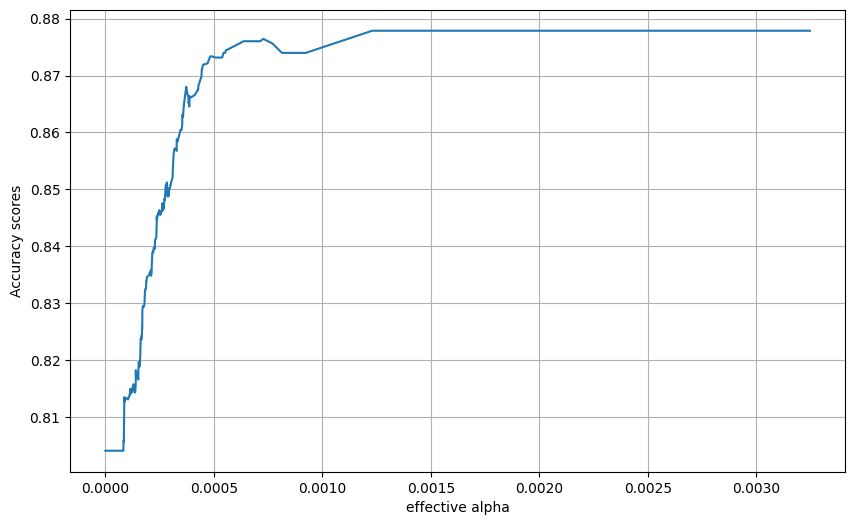

Decision Tree Accuracy (with pruning): 0.6635245901639344
Decision Tree Classification Report (with pruning):
               precision    recall  f1-score   support

           0       0.20      0.59      0.30       596
           1       0.92      0.67      0.78      4284

    accuracy                           0.66      4880
   macro avg       0.56      0.63      0.54      4880
weighted avg       0.83      0.66      0.72      4880


Pruned Decision Tree Feature Importance:
                         Feature  Importance
55              ShortRunEmphasis    0.322083
69                ZonePercentage    0.197531
68                   ZoneEntropy    0.108325
47  LongRunHighGrayLevelEmphasis    0.060905
57  ShortRunLowGrayLevelEmphasis    0.060496
..                           ...         ...
30                           Idn    0.000000
31                          Imc1    0.000000
32                          Imc2    0.000000
33               InverseVariance    0.000000
70                  ZoneV

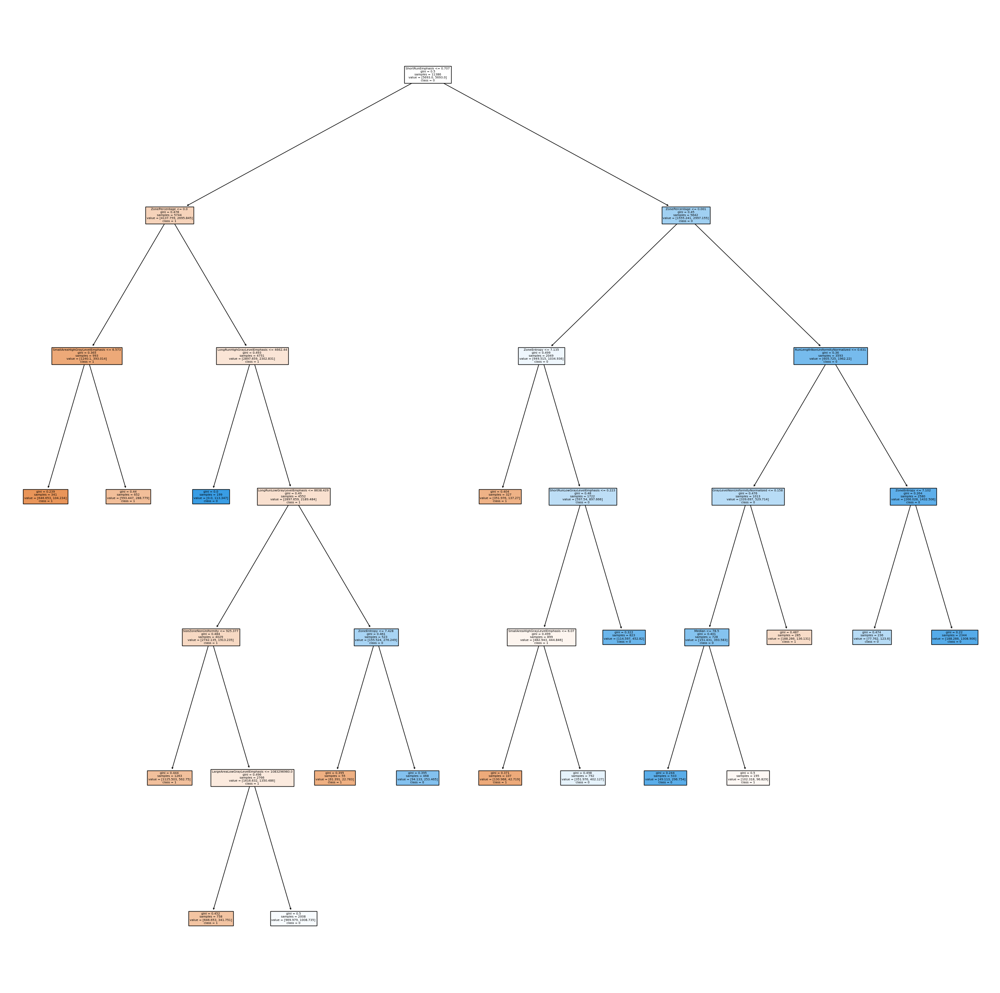

In [12]:
# If plot tree = True will plot the original tree
logreg_importance_df, dt_importance_df, pruned_dt_importance_df = analyze_image_quality(data, target_variable, features, plot_tree=False, prune=True, verbose=False)

In [13]:
logreg_importance_df

,Feature,Importance
61,LargeAreaLowGrayLevelEmphasis,2.922686e-10
2,Energy,1.389538e-12
15,TotalEnergy,1.389538e-12
51,RunLengthNonUniformity,7.992179e-13
48,LongRunLowGrayLevelEmphasis,8.680801e-16
...,...,...
0,10Percentile,-2.005790e-19
19,ClusterProminence,-3.373259e-17
60,LargeAreaHighGrayLevelEmphasis,-1.977514e-12
70,ZoneVariance,-1.390447e-10


In [14]:
pruned_dt_importance_df

,Feature,Importance
55,ShortRunEmphasis,0.322083
69,ZonePercentage,0.197531
68,ZoneEntropy,0.108325
47,LongRunHighGrayLevelEmphasis,0.060905
57,ShortRunLowGrayLevelEmphasis,0.060496
...,...,...
30,Idn,0.000000
31,Imc1,0.000000
32,Imc2,0.000000
33,InverseVariance,0.000000


### Diabetic Retinopathy Detection

#### 5 Class DR

In [16]:
# Load labels
labels_df = pd.read_csv(label_file)
labels = labels_df.set_index('image_id')['DR_ICDR']

# rename labels column 'DR_ICDR' to LABEL
labels.rename(LABEL, inplace=True)

# Merge features with labels
data = features_df.merge(labels, left_index=True, right_index=True)

Setting class weigths to: {0: 0.21364105450792759, 1: 21.085185185185185, 2: 10.948076923076924, 3: 16.99402985074627, 4: 8.220938628158844}


####################  Logistic Regression  ####################


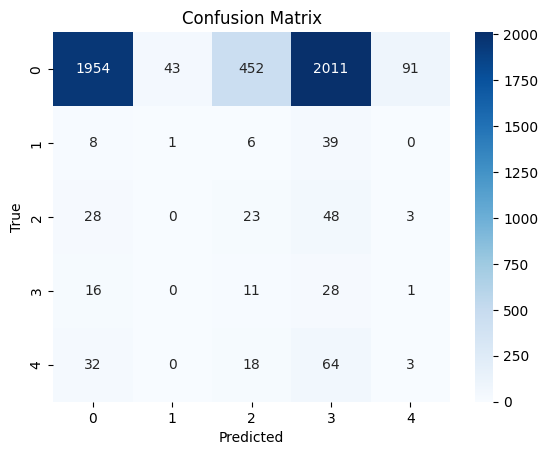

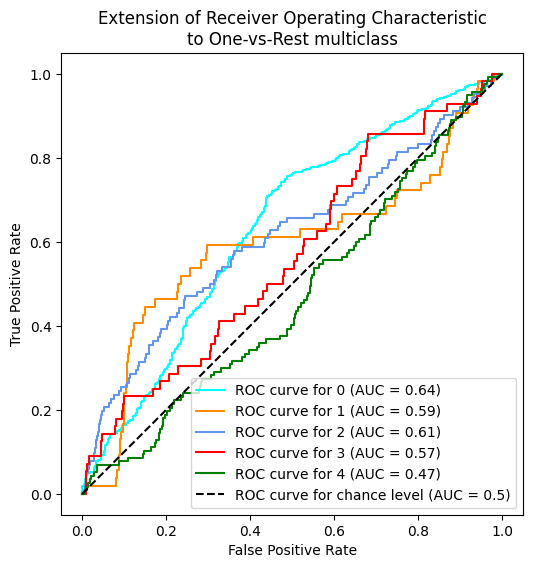

              precision    recall  f1-score   support

           0       0.96      0.43      0.59      4551
           1       0.02      0.02      0.02        54
           2       0.05      0.23      0.08       102
           3       0.01      0.50      0.02        56
           4       0.03      0.03      0.03       117

    accuracy                           0.41      4880
   macro avg       0.21      0.24      0.15      4880
weighted avg       0.90      0.41      0.56      4880

####################  Decision Tree  ####################


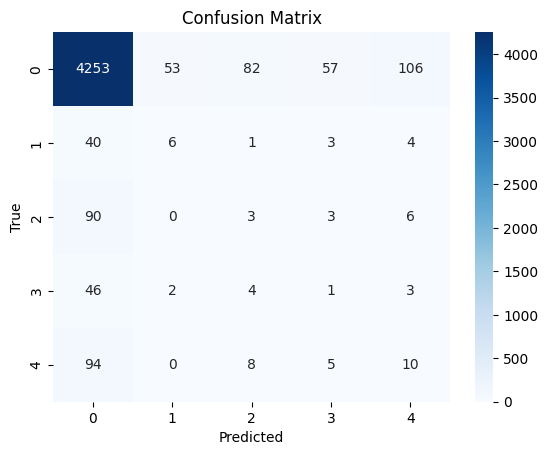

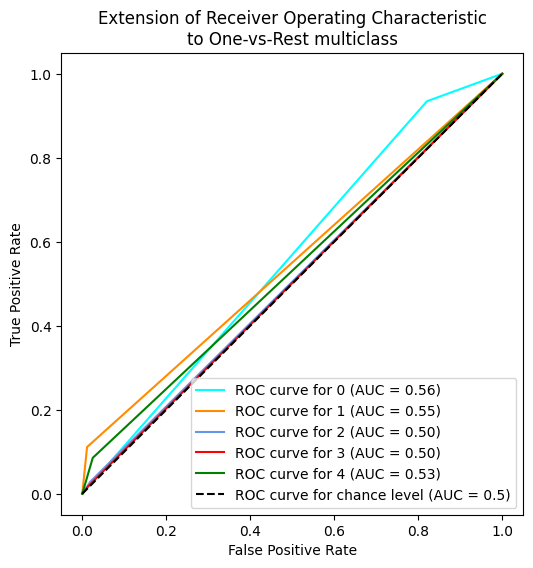

              precision    recall  f1-score   support

           0       0.94      0.93      0.94      4551
           1       0.10      0.11      0.10        54
           2       0.03      0.03      0.03       102
           3       0.01      0.02      0.02        56
           4       0.08      0.09      0.08       117

    accuracy                           0.88      4880
   macro avg       0.23      0.24      0.23      4880
weighted avg       0.88      0.88      0.88      4880



In [20]:
# Split data into features and labels
X = data.drop(LABEL, axis=1)
y = data[LABEL]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

if CLASS_WEIGTHS:
    class_weights = compute_class_weight("balanced", classes=np.unique(y_train), y=y_train)
    # Create a dictionary from class labels and weights
    class_weights = {class_label: weight for class_label, weight in zip(np.unique(y_train), class_weights)}
    print(f'Setting class weigths to: {class_weights}')

    models = [
        #("SVM", SVC(class_weight=class_weights, probability=True)),
        ("Logistic Regression", LogisticRegression(class_weight=class_weights)),
        ('Decision Tree', DecisionTreeClassifier(class_weight=class_weights)),
    ]
else:
    models = [
        #("SVM", SVC(probability=True)),
        ("Logistic Regression", LogisticRegression())
        ('Decision Tree', DecisionTreeClassifier()),
    ]
    
model, _ = train_and_evaluate_model(X_train, X_test, y_train, y_test, models=models)

########################################  Logistic Regression  ########################################
Logistic Regression Accuracy: 0.4323770491803279
Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.45      0.61      4563
           1       0.03      0.02      0.02        49
           2       0.04      0.08      0.05        93
           3       0.02      0.65      0.03        57
           4       0.05      0.04      0.05       118

    accuracy                           0.43      4880
   macro avg       0.22      0.25      0.15      4880
weighted avg       0.90      0.43      0.58      4880


Logistic Regression Feature Importance:
                           Feature    Importance
59               LargeAreaEmphasis  6.707651e-11
70                    ZoneVariance  6.664426e-11
51          RunLengthNonUniformity  3.593395e-13
15                     TotalEnergy  1.790990e-13
2                           

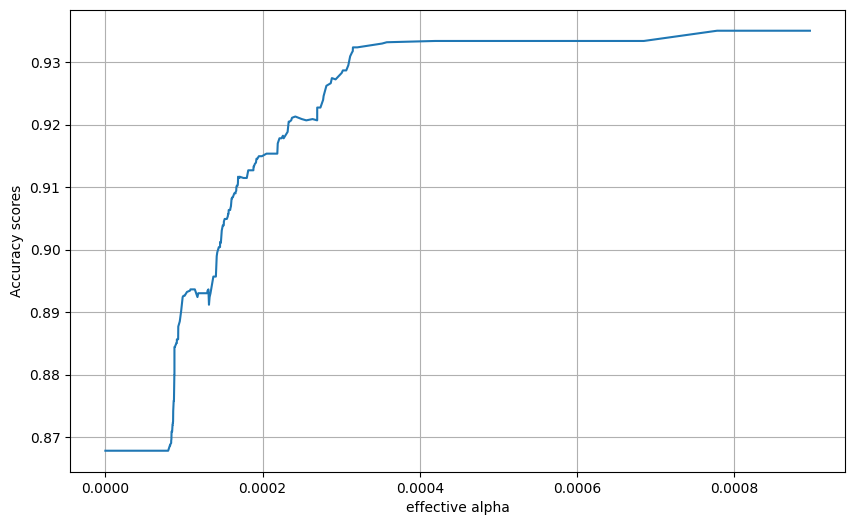

Decision Tree Accuracy (with pruning): 0.3487704918032787
Decision Tree Classification Report (with pruning):
               precision    recall  f1-score   support

           0       0.97      0.35      0.52      4563
           1       0.04      0.33      0.06        49
           2       0.03      0.32      0.05        93
           3       0.02      0.30      0.04        57
           4       0.03      0.25      0.06       118

    accuracy                           0.35      4880
   macro avg       0.22      0.31      0.15      4880
weighted avg       0.91      0.35      0.49      4880


Pruned Decision Tree Feature Importance:
                   Feature  Importance
69          ZonePercentage    0.079063
20            ClusterShade    0.045010
42  GrayLevelNonUniformity    0.044765
31                    Imc1    0.039978
23             Correlation    0.039460
..                     ...         ...
11                   Range    0.000000
10                 Minimum    0.000000
9      

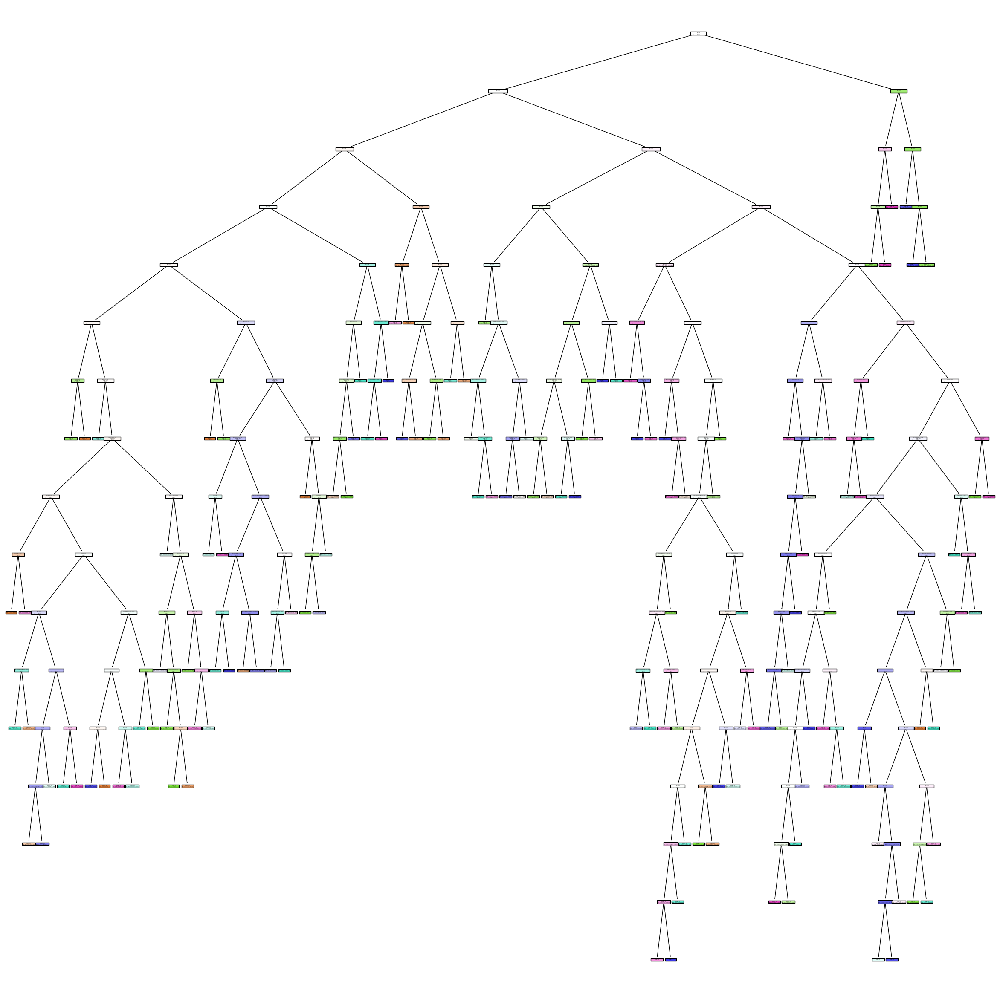

In [21]:
# Create a list of features removing LABEL from the list
features = list(data.columns)
features.remove(LABEL)

target_variable = LABEL

# If plot tree = True will plot the original tree
logreg_importance_df, dt_importance_df, pruned_dt_importance_df = analyze_image_quality(data, target_variable, features, plot_tree=False, prune=True, verbose=False)

#### 3 Class DR

In [22]:
data[LABEL] = data[LABEL].apply((lambda x: 1 if x in (1, 2, 3) else (2 if x == 4 else 0)))

Setting class weigths to: {0: 0.3560684241798793, 1: 8.434074074074074, 2: 13.701564380264742}


####################  Logistic Regression  ####################


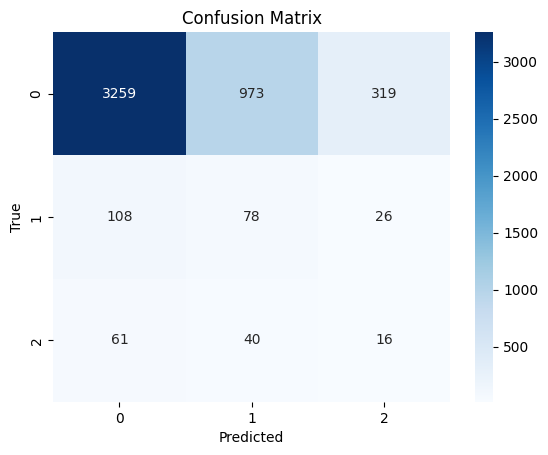

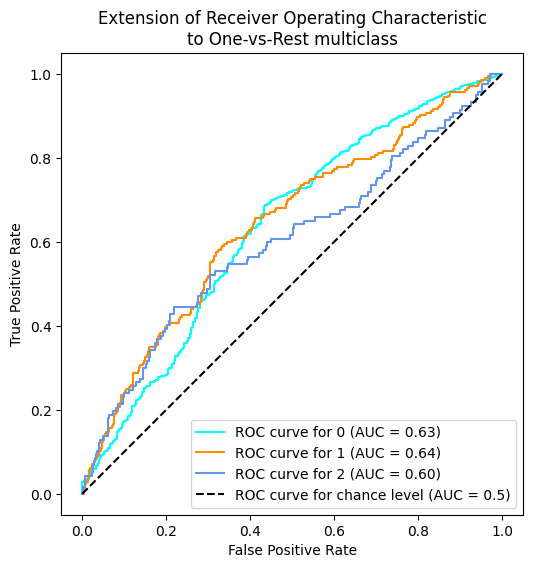

              precision    recall  f1-score   support

           0       0.95      0.72      0.82      4551
           1       0.07      0.37      0.12       212
           2       0.04      0.14      0.07       117

    accuracy                           0.69      4880
   macro avg       0.36      0.41      0.33      4880
weighted avg       0.89      0.69      0.77      4880

####################  Decision Tree  ####################


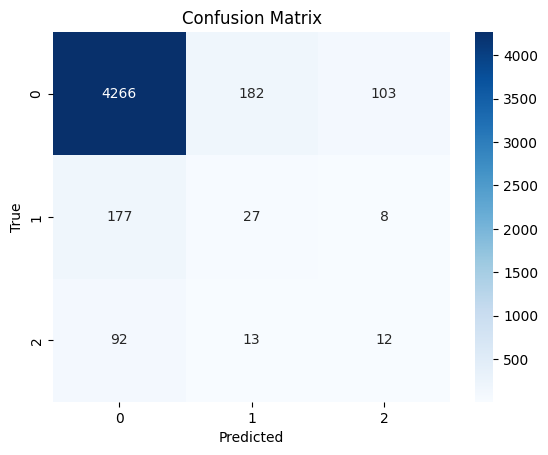

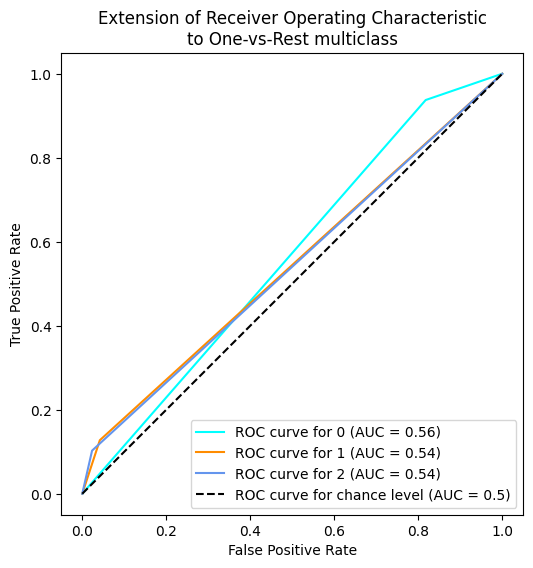

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      4551
           1       0.12      0.13      0.12       212
           2       0.10      0.10      0.10       117

    accuracy                           0.88      4880
   macro avg       0.39      0.39      0.39      4880
weighted avg       0.88      0.88      0.88      4880



In [23]:
# Split data into features and labels
X = data.drop(LABEL, axis=1)
y = data[LABEL]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

if CLASS_WEIGTHS:
    class_weights = compute_class_weight("balanced", classes=np.unique(y_train), y=y_train)
    # Create a dictionary from class labels and weights
    class_weights = {class_label: weight for class_label, weight in zip(np.unique(y_train), class_weights)}
    print(f'Setting class weigths to: {class_weights}')

    models = [
        #("SVM", SVC(class_weight=class_weights, probability=True)),
        ("Logistic Regression", LogisticRegression(class_weight=class_weights)),
        ('Decision Tree', DecisionTreeClassifier(class_weight=class_weights)),
    ]
else:
    models = [
        #("SVM", SVC(probability=True)),
        ("Logistic Regression", LogisticRegression())
        ('Decision Tree', DecisionTreeClassifier()),
    ]
    
model, _ = train_and_evaluate_model(X_train, X_test, y_train, y_test, models=models)

########################################  Logistic Regression  ########################################
Logistic Regression Accuracy: 0.660655737704918
Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.69      0.80      4563
           1       0.06      0.41      0.10       199
           2       0.02      0.04      0.03       118

    accuracy                           0.66      4880
   macro avg       0.34      0.38      0.31      4880
weighted avg       0.89      0.66      0.75      4880


Logistic Regression Feature Importance:
                           Feature    Importance
59               LargeAreaEmphasis  9.517046e-11
70                    ZoneVariance  9.457725e-11
51          RunLengthNonUniformity  3.347553e-13
2                           Energy  2.395835e-13
15                     TotalEnergy  2.395835e-13
..                             ...           ...
17                        Variance -6.3

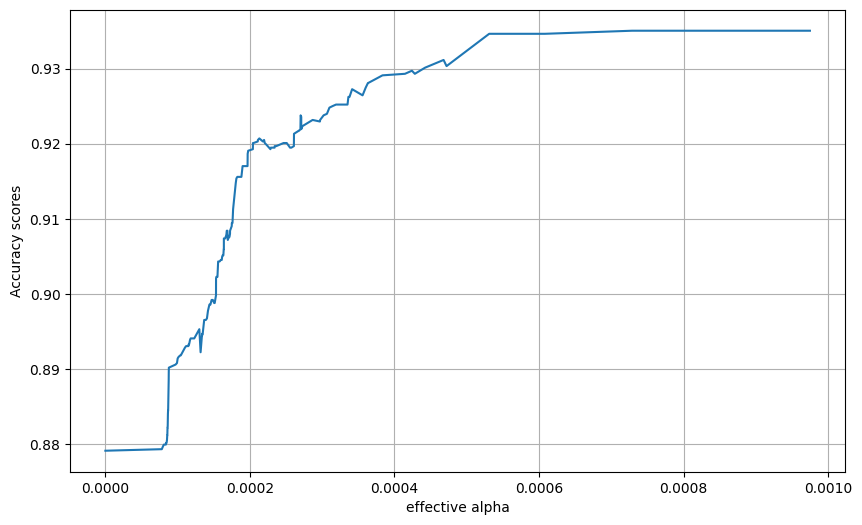

Decision Tree Accuracy (with pruning): 0.5211065573770491
Decision Tree Classification Report (with pruning):
               precision    recall  f1-score   support

           0       0.97      0.53      0.68      4563
           1       0.07      0.53      0.12       199
           2       0.04      0.31      0.07       118

    accuracy                           0.52      4880
   macro avg       0.36      0.45      0.29      4880
weighted avg       0.91      0.52      0.65      4880


Pruned Decision Tree Feature Importance:
                           Feature  Importance
31                            Imc1    0.135638
23                     Correlation    0.057383
38              MaximumProbability    0.057035
48     LongRunLowGrayLevelEmphasis    0.044147
60  LargeAreaHighGrayLevelEmphasis    0.041454
..                             ...         ...
29                            Idmn    0.000000
30                             Idn    0.000000
34                    JointAverage    0.000

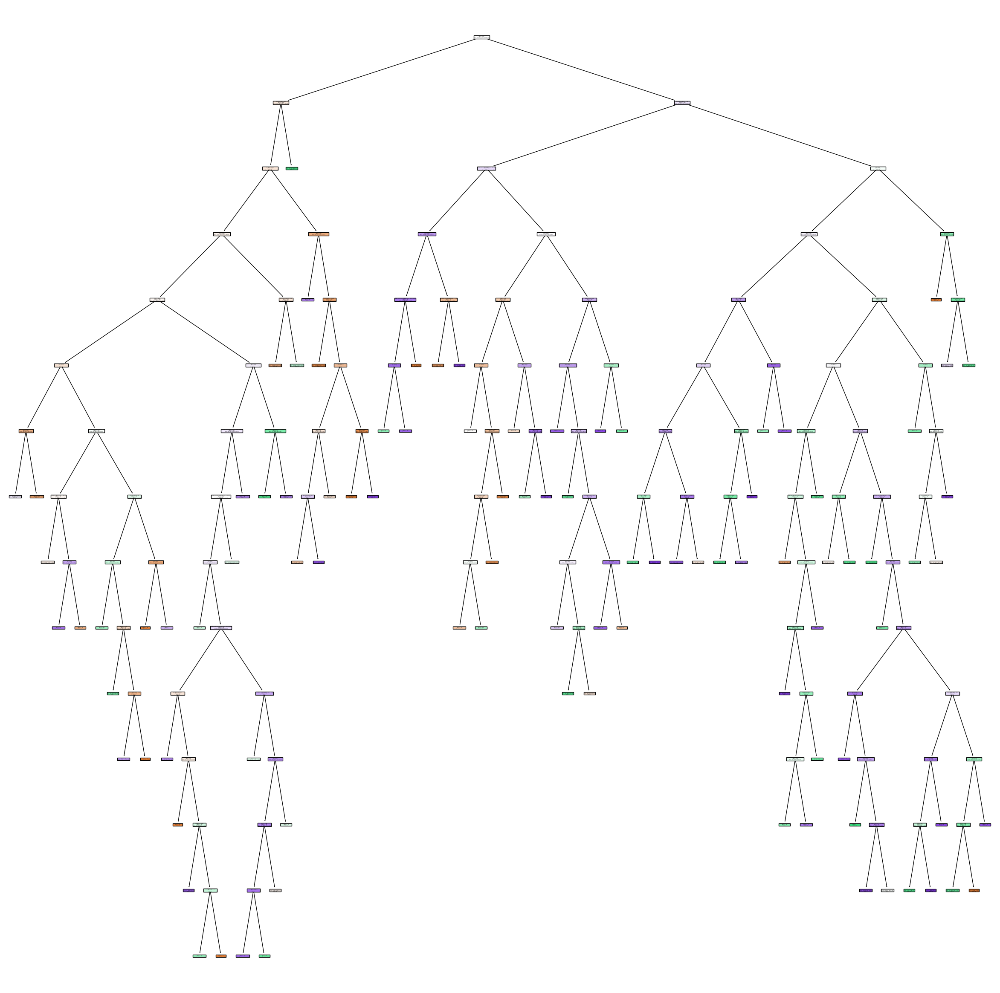

In [24]:
# Create a list of features removing LABEL from the list
features = list(data.columns)
features.remove(LABEL)

target_variable = LABEL

# If plot tree = True will plot the original tree
logreg_importance_df, dt_importance_df, pruned_dt_importance_df = analyze_image_quality(data, target_variable, features, plot_tree=False, prune=True, verbose=False)

#### 2 Class DR

In [25]:
data[LABEL] = data[LABEL].apply((lambda x: 0 if x == 0 else 1))

Setting class weigths to: {0: 0.5341026362698189, 1: 7.8308115543328745}


####################  Logistic Regression  ####################


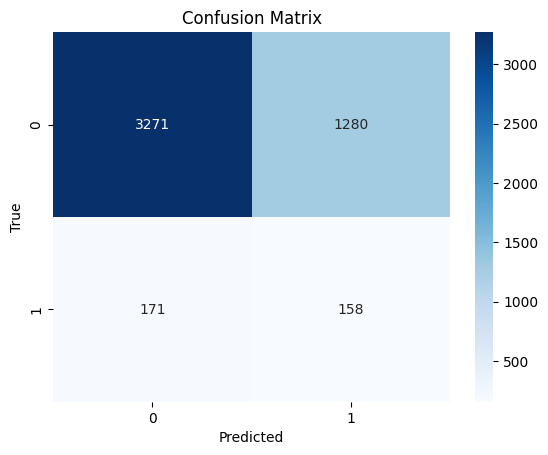

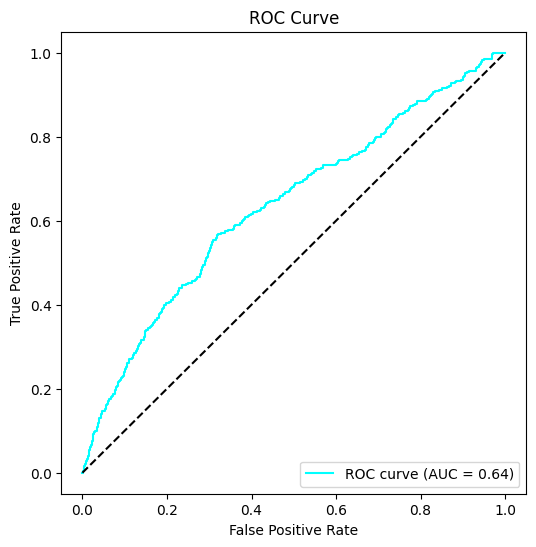

              precision    recall  f1-score   support

           0       0.95      0.72      0.82      4551
           1       0.11      0.48      0.18       329

    accuracy                           0.70      4880
   macro avg       0.53      0.60      0.50      4880
weighted avg       0.89      0.70      0.78      4880

####################  Decision Tree  ####################


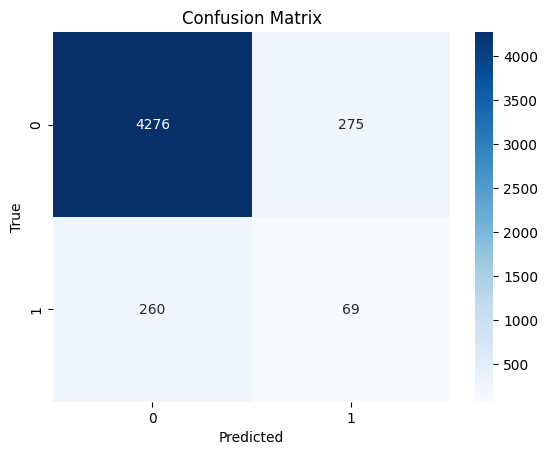

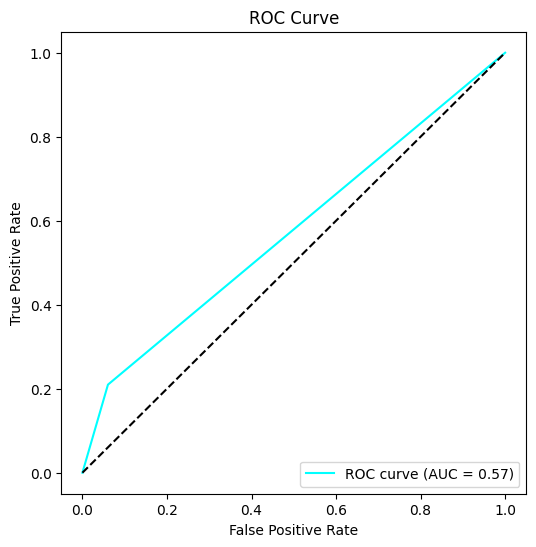

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      4551
           1       0.20      0.21      0.21       329

    accuracy                           0.89      4880
   macro avg       0.57      0.57      0.57      4880
weighted avg       0.89      0.89      0.89      4880



In [26]:
# Split data into features and labels
X = data.drop(LABEL, axis=1)
y = data[LABEL]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

if CLASS_WEIGTHS:
    class_weights = compute_class_weight("balanced", classes=np.unique(y_train), y=y_train)
    # Create a dictionary from class labels and weights
    class_weights = {class_label: weight for class_label, weight in zip(np.unique(y_train), class_weights)}
    print(f'Setting class weigths to: {class_weights}')

    models = [
        #("SVM", SVC(class_weight=class_weights, probability=True)),
        ("Logistic Regression", LogisticRegression(class_weight=class_weights)),
        ('Decision Tree', DecisionTreeClassifier(class_weight=class_weights)),
    ]
else:
    models = [
        #("SVM", SVC(probability=True)),
        ("Logistic Regression", LogisticRegression())
        ('Decision Tree', DecisionTreeClassifier()),
    ]
    
model, _ = train_and_evaluate_model(X_train, X_test, y_train, y_test, models=models)

########################################  Logistic Regression  ########################################
Logistic Regression Accuracy: 0.6782786885245902
Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.69      0.80      4563
           1       0.09      0.45      0.15       317

    accuracy                           0.68      4880
   macro avg       0.52      0.57      0.48      4880
weighted avg       0.89      0.68      0.76      4880


Logistic Regression Feature Importance:
                           Feature    Importance
61   LargeAreaLowGrayLevelEmphasis  4.665646e-10
60  LargeAreaHighGrayLevelEmphasis  5.643249e-12
47    LongRunHighGrayLevelEmphasis  1.804408e-14
48     LongRunLowGrayLevelEmphasis  1.538406e-15
17                        Variance  1.126373e-15
..                             ...           ...
15                     TotalEnergy -3.399704e-13
2                           Energy -3.39970

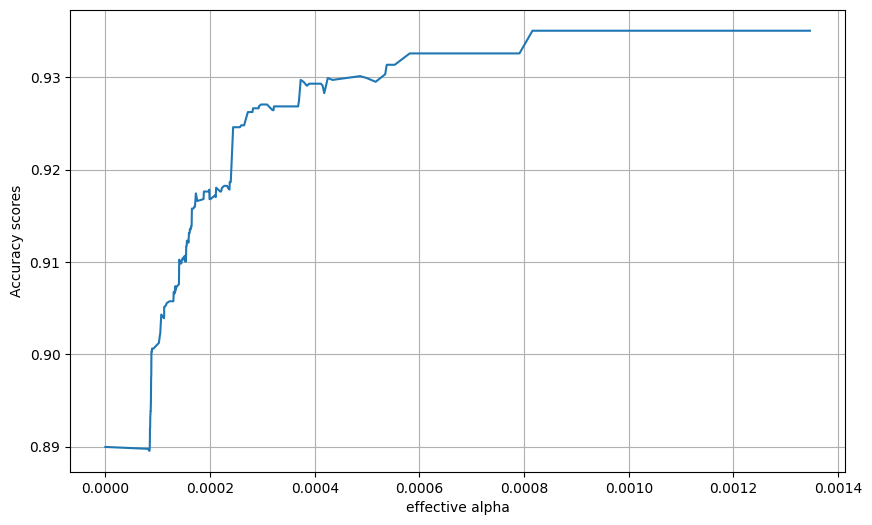

Decision Tree Accuracy (with pruning): 0.7194672131147541
Decision Tree Classification Report (with pruning):
               precision    recall  f1-score   support

           0       0.96      0.73      0.83      4563
           1       0.12      0.55      0.20       317

    accuracy                           0.72      4880
   macro avg       0.54      0.64      0.52      4880
weighted avg       0.90      0.72      0.79      4880


Pruned Decision Tree Feature Importance:
                     Feature  Importance
16                Uniformity    0.185899
62  LowGrayLevelZoneEmphasis    0.158495
23               Correlation    0.093340
31                      Imc1    0.063499
50                RunEntropy    0.054504
..                       ...         ...
30                       Idn    0.000000
34              JointAverage    0.000000
1               90Percentile    0.000000
36              JointEntropy    0.000000
70              ZoneVariance    0.000000

[71 rows x 2 columns]


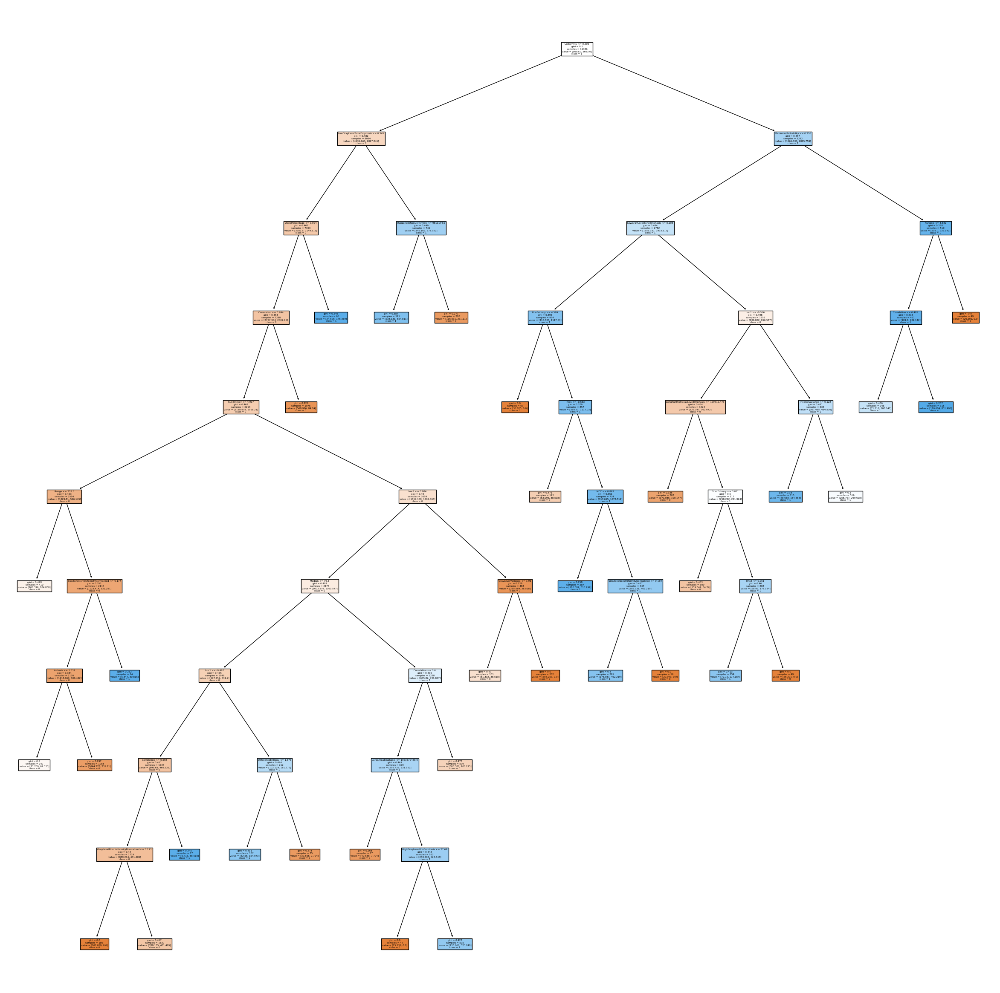

In [27]:
# Create a list of features removing LABEL from the list
features = list(data.columns)
features.remove(LABEL)

target_variable = LABEL

# If plot tree = True will plot the original tree
logreg_importance_df, dt_importance_df, pruned_dt_importance_df = analyze_image_quality(data, target_variable, features, plot_tree=False, prune=True, verbose=False)